In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
%matplotlib inline

In [2]:
def draw_plots(img_1, title1, img_2, title2, gray=False):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    if gray:
        ax1.imshow(img_1, cmap='gray')
    else:
        ax1.imshow(img_1)
    ax1.set_title(title1, fontsize=50)
    if gray:
        ax2.imshow(img_2, cmap='gray')
    else:
        ax2.imshow(img_2)
    ax2.set_title(title2, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


In [3]:
def draw_img_variants(img, scheme = 'HLS'):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h_channel = hls[:, : , 0]
    l_channel = hls[:, : , 1]
    s_channel = hls[:, : , 2]    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
    f.tight_layout()
    ax1.set_title("Original")
    ax1.imshow(img)
    ax2.set_title("H Channel")
    ax2.imshow(h_channel)
    ax3.set_title("L Channel")
    ax3.imshow(l_channel)
    ax4.set_title("S Channel")
    ax4.imshow(s_channel)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Calibrate Camera

**Images actually have 6*9 corners**

In [4]:
images = glob.glob('camera_cal/calibration*.jpg')

In [5]:
def calibrate_camera():
    objpoints = []
    imgpoints = []
    objp = np.zeros((6*9, 3), np.float32)
    objp[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2)
    img_shape = None
    for img_file in images:
        img = mpimg.imread(img_file)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        img_shape = gray.shape[::-1]
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_shape,None,None)
    return (mtx, dist)

In [6]:
mtx, dist = calibrate_camera()

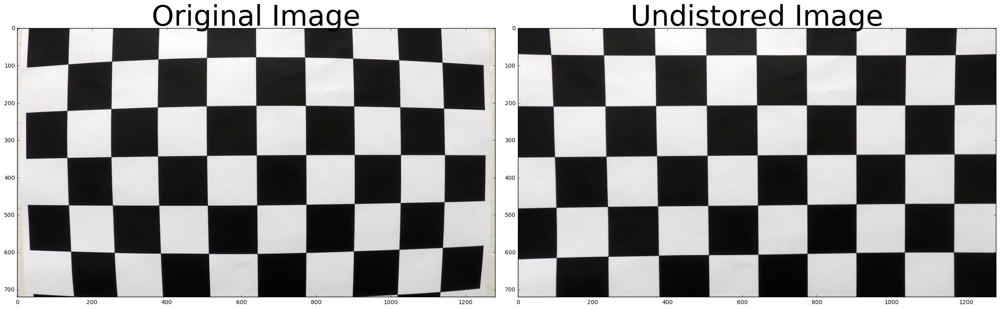

In [7]:
img_test = mpimg.imread('camera_cal/calibration1.jpg')

uimage = cv2.undistort(img_test, mtx, dist, None, mtx)
draw_plots(img_test, "Original Image", uimage, "Undistored Image")

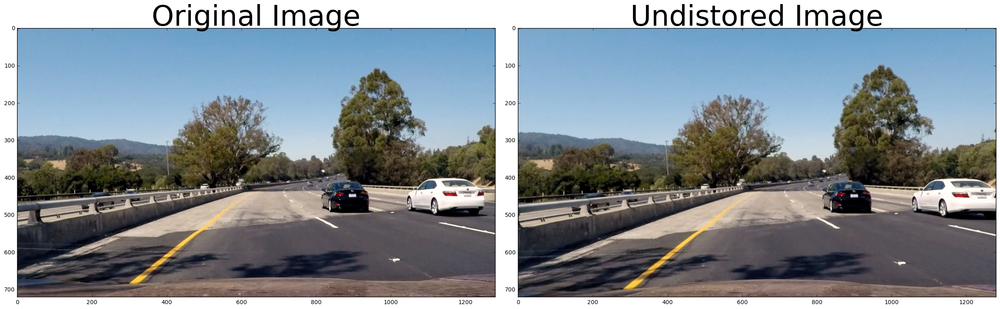

In [8]:
img_test = mpimg.imread('test_images/test4.jpg')
uimage = cv2.undistort(img_test, mtx, dist, None, mtx)
draw_plots(img_test, "Original Image", uimage, "Undistored Image")

In [9]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    gradx = 1 if orient == 'x' else 0
    grady = 1 if orient == 'y' else 0
    sobel = cv2.Sobel(gray, cv2.CV_64F, gradx, grady)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8( 255 * abs_sobel / np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return binary_output

In [10]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

In [11]:
def corners_unwarp(img, nx, ny, mtx, dist):
    # Pass in your image into this function
    # Write code to do the following steps
    # 1) Undistort using mtx and dist
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # 2) Convert to grayscale
    gray = cv2.cvtColor(undist,cv2.COLOR_RGB2GRAY)
    # 3) Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    print(ret)
    # If found, draw corners
    if ret == True:
        # Draw and display the corners
        cv2.drawChessboardCorners(gray, (nx, ny), corners, ret)
        plt.imshow(gray)
        offset = 100 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])
        # 4) If corners found: 
                # a) draw corners
                # b) define 4 source points src = np.float32([[,],[,],[,],[,]])
                     #Note: you could pick any four of the detected corners 
                     # as long as those four corners define a rectangle
                     #One especially smart way to do this would be to use four well-chosen
                     # corners that were automatically detected during the undistortion steps
                     #We recommend using the automatic detection of corners in your code
                # c) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
                # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
                # e) use cv2.warpPerspective() to warp your image to a top-down view
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        M = cv2.getPerspectiveTransform(src, dst)
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)
                                     
        return warped, M


In [12]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    binary_output = np.zeros_like(direction)
    binary_output[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    return binary_output

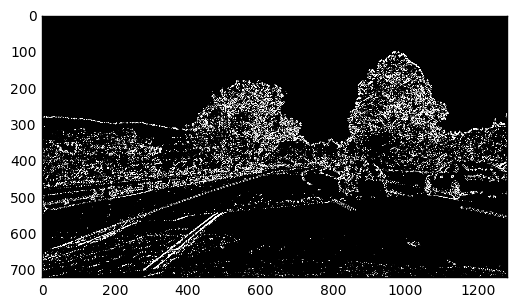

In [13]:
gradx = abs_sobel_thresh(uimage, orient='x', thresh_min=10, thresh_max=100)
grady = abs_sobel_thresh(uimage, orient='y', thresh_min=10, thresh_max=100)
mag_binary = mag_thresh(uimage, sobel_kernel=7, mag_thresh=(30, 100))
dir_binary = dir_threshold(uimage, sobel_kernel=7, thresh=(np.pi/1, np.pi/2))
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
plt.imshow(combined, cmap='gray')

In [14]:
src = np.float32([[800, 500], [950, 585], [450, 585], [550, 500]])
dst = np.float32([[990, 500], [990, 650], [500, 650], [500, 500]])


In [16]:
def warper(img, src, dst):
    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)  # keep same size as input image

    return warped

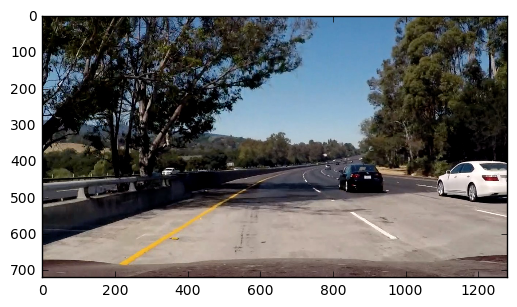

In [17]:

img_test = mpimg.imread('test_images/test5.jpg')
plt.imshow(img_test)

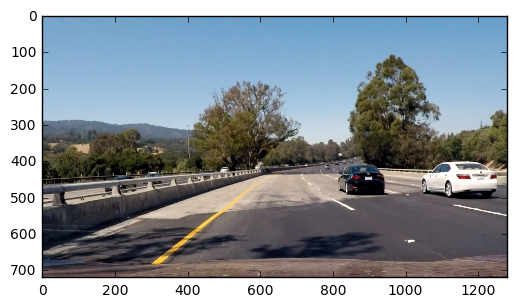

In [18]:
img_test = mpimg.imread('test_images/test4.jpg')
plt.imshow(img_test)

### Bird's Eye view (Perspective Transform)

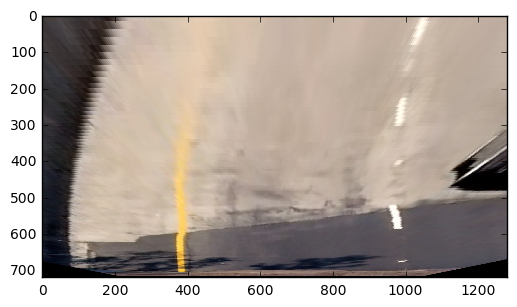

In [19]:
src = np.float32([[800, 500], [950, 585], [450, 585], [550, 500]])
dst = np.float32([[990, 500], [990, 650], [400, 650], [400, 500]])
warped = warper(img_test, src, dst)
%matplotlib inline
plt.imshow(warped)

# Channel Exploration of images

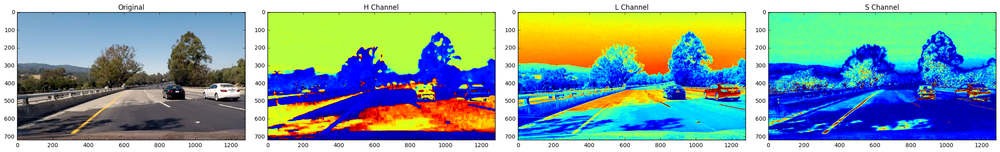

In [20]:
draw_img_variants(img_test)

### Color and Threshold Gradient

In [21]:
def color_gradient_threshold(img, s_thresh=(170, 255), sx_thresh=(70, 150)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return combined_binary, color_binary

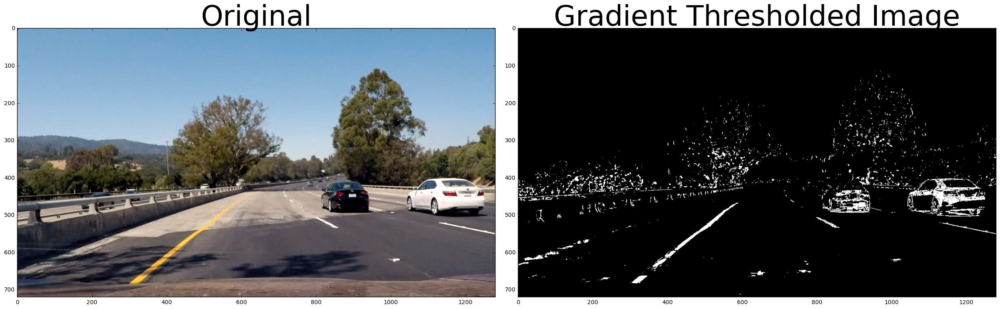

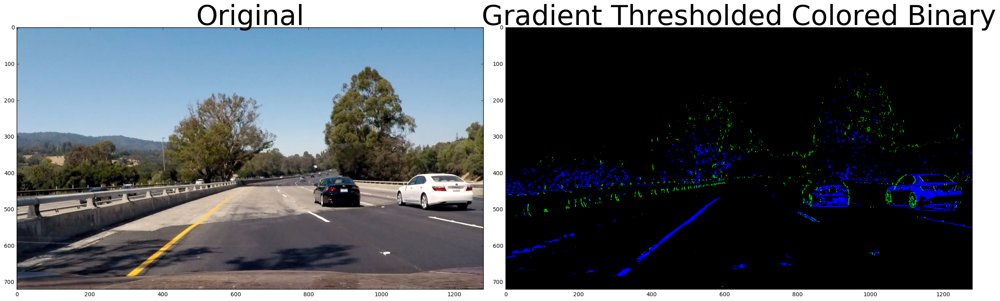

In [22]:
gradient_image, colored_binary = color_gradient_threshold(img_test)
draw_plots(img_test, 'Original', gradient_image, 'Gradient Thresholded Image', True)
draw_plots(img_test, 'Original', colored_binary, 'Gradient Thresholded Colored Binary')

(720, 1280)


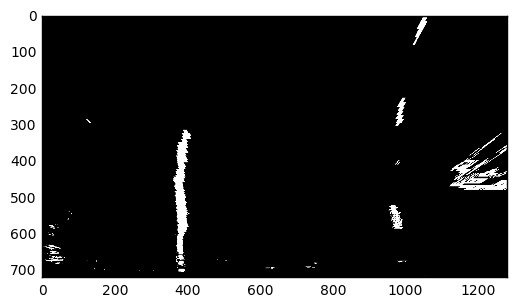

In [23]:
binary_warped = warper(gradient_image, src, dst)
plt.imshow(binary_warped, cmap='gray')
print(binary_warped.shape)

### Histogram Exploration

In [24]:
def histogram(img):
    histogram = np.sum(img[img.shape[0]/2:,:], axis=0)
    plt.plot(histogram)

/Users/shrikararchak/Anaconda/anaconda/envs/tensorflow/lib/python3.5/site-packages/ipykernel/__main__.py:2: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  from ipykernel import kernelapp as app


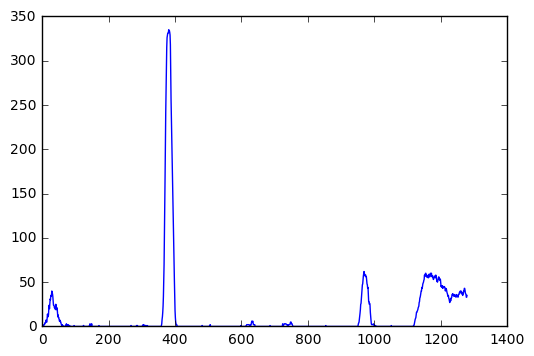

In [25]:
histogram(binary_warped)

In [26]:
histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_size = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_size
    win_y_high = binary_warped.shape[0] - window*window_size
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)


/Users/shrikararchak/Anaconda/anaconda/envs/tensorflow/lib/python3.5/site-packages/ipykernel/__main__.py:1: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':


(720, 0)

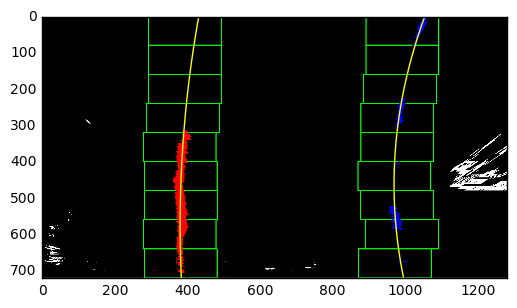

In [27]:
fity = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
fit_leftx = left_fit[0]*fity**2 + left_fit[1]*fity + left_fit[2]
fit_rightx = right_fit[0]*fity**2 + right_fit[1]*fity + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(fit_leftx, fity, color='yellow')
plt.plot(fit_rightx, fity, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

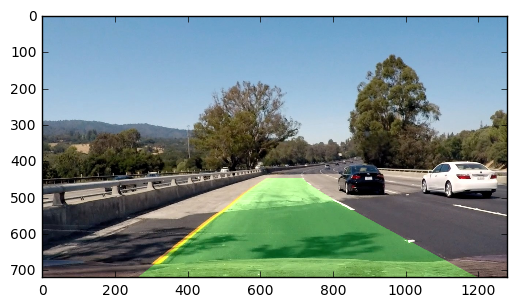

In [28]:
yvals = fity
image  = img_test
# Create an image to draw the lines on
warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
Minv = cv2.getPerspectiveTransform(dst, src)
# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([fit_leftx, yvals]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([fit_rightx, yvals])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(img_test, 1, newwarp, 0.3, 0)
plt.imshow(result)

In [151]:
y_eval = np.max(yvals)
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print(left_curverad, right_curverad)

752.929953237 1046.25416462


In [49]:
import datetime

In [29]:
def pipeline(img):
#     ts = str(datetime.datetime.utcnow().timestamp())
#     mpimg.imsave("outfile/out_"+ts+".jpg", img)
    orig = np.copy(img)
    if img == None:
        print("NO DATA")
    gradient_image, colored_binary = color_gradient_threshold(img)
    print(gradient_image.shape)
    binary_warped = warper(gradient_image, src, dst)
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_size = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_size
        win_y_high = binary_warped.shape[0] - window*window_size
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    fity = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    fit_leftx = left_fit[0]*fity**2 + left_fit[1]*fity + left_fit[2]
    fit_rightx = right_fit[0]*fity**2 + right_fit[1]*fity + right_fit[2]
    yvals = fity
    image  = np.copy(img)
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([fit_leftx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([fit_rightx, yvals])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(orig, 1, newwarp, 0.3, 0)
    plt.imshow(result)
    return result

(720, 1280)


/Users/shrikararchak/Anaconda/anaconda/envs/tensorflow/lib/python3.5/site-packages/ipykernel/__main__.py:5: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
/Users/shrikararchak/Anaconda/anaconda/envs/tensorflow/lib/python3.5/site-packages/ipykernel/__main__.py:10: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


array([[[111, 151, 187],
        [111, 151, 187],
        [111, 151, 187],
        ..., 
        [ 68, 122, 169],
        [ 65, 121, 168],
        [ 65, 121, 168]],

       [[111, 151, 187],
        [111, 151, 187],
        [111, 151, 187],
        ..., 
        [ 69, 123, 170],
        [ 67, 123, 170],
        [ 67, 123, 170]],

       [[111, 151, 187],
        [111, 151, 187],
        [111, 151, 187],
        ..., 
        [ 68, 124, 171],
        [ 68, 124, 171],
        [ 68, 126, 172]],

       ..., 
       [[ 98,  74,  72],
        [100,  76,  74],
        [102,  78,  76],
        ..., 
        [108,  93,  90],
        [108,  93,  90],
        [108,  93,  90]],

       [[100,  76,  74],
        [102,  78,  76],
        [104,  80,  78],
        ..., 
        [107,  92,  89],
        [106,  91,  88],
        [104,  89,  86]],

       [[100,  76,  74],
        [102,  78,  76],
        [103,  79,  77],
        ..., 
        [106,  91,  88],
        [103,  88,  85],
        [100,  85,

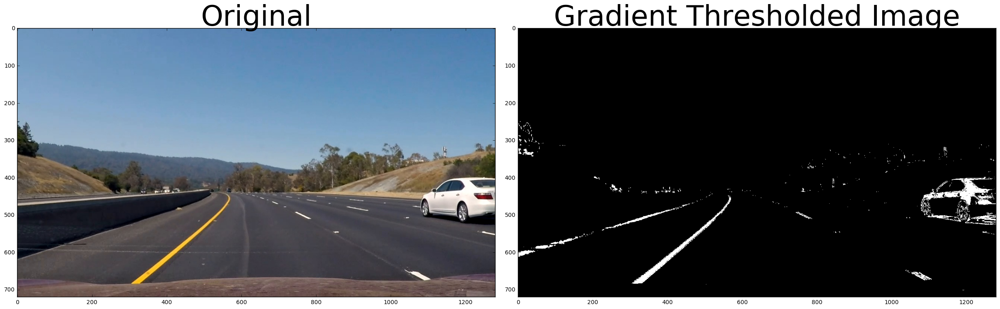

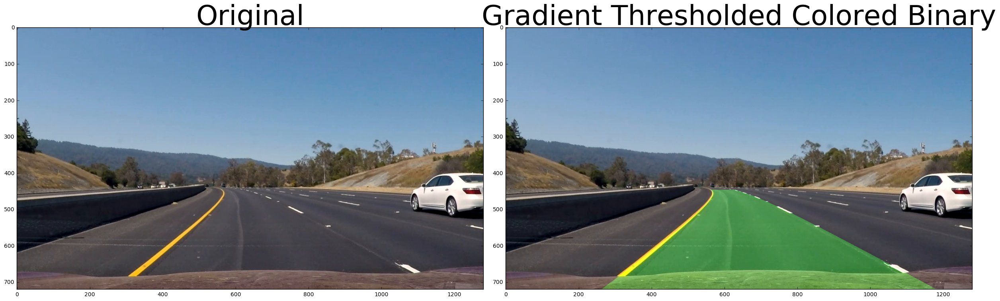

In [30]:
img_test = mpimg.imread('outfile/out_1485870227.73606.jpg')
gradient_image, colored_binary = color_gradient_threshold(img_test)
binary_warped = warper(gradient_image, src, dst)
draw_plots(img_test, 'Original', gradient_image, 'Gradient Thresholded Image', True)
draw_plots(img_test, 'Original', binary_warped, 'Gradient Thresholded Colored Binary')
pipeline(img_test)

(720, 1280)
[MoviePy] >>>> Building video output.mp4
[MoviePy] Writing video output.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

(720, 1280)


  0%|          | 2/1261 [00:00<02:55,  7.17it/s]

(720, 1280)


  0%|          | 3/1261 [00:00<02:50,  7.36it/s]

(720, 1280)
(720, 1280)


  0%|          | 5/1261 [00:00<02:44,  7.62it/s]

(720, 1280)


  0%|          | 6/1261 [00:00<02:43,  7.68it/s]

(720, 1280)
(720, 1280)


  1%|          | 8/1261 [00:01<02:43,  7.65it/s]

(720, 1280)


  1%|          | 9/1261 [00:01<02:38,  7.89it/s]

(720, 1280)


  1%|          | 10/1261 [00:01<02:41,  7.77it/s]

(720, 1280)
(720, 1280)


  1%|          | 11/1261 [00:01<02:46,  7.52it/s]

(720, 1280)


  1%|          | 13/1261 [00:01<02:43,  7.65it/s]

(720, 1280)


  1%|          | 14/1261 [00:01<02:45,  7.53it/s]

(720, 1280)
(720, 1280)


  1%|          | 15/1261 [00:02<03:05,  6.72it/s]

(720, 1280)


  1%|▏         | 16/1261 [00:02<03:17,  6.29it/s]

(720, 1280)


  1%|▏         | 17/1261 [00:02<03:20,  6.21it/s]

(720, 1280)


  1%|▏         | 18/1261 [00:02<03:31,  5.89it/s]

(720, 1280)


  2%|▏         | 20/1261 [00:02<03:12,  6.44it/s]

(720, 1280)


  2%|▏         | 21/1261 [00:02<03:02,  6.81it/s]

(720, 1280)


  2%|▏         | 22/1261 [00:03<02:58,  6.94it/s]

(720, 1280)


  2%|▏         | 23/1261 [00:03<02:54,  7.09it/s]

(720, 1280)
(720, 1280)


  2%|▏         | 24/1261 [00:03<03:00,  6.87it/s]

(720, 1280)


  2%|▏         | 26/1261 [00:03<02:54,  7.08it/s]

(720, 1280)


  2%|▏         | 27/1261 [00:03<02:49,  7.28it/s]

(720, 1280)


  2%|▏         | 28/1261 [00:03<02:47,  7.36it/s]

(720, 1280)


  2%|▏         | 29/1261 [00:04<02:48,  7.31it/s]

(720, 1280)


  2%|▏         | 30/1261 [00:04<02:46,  7.41it/s]

(720, 1280)


  2%|▏         | 31/1261 [00:04<02:46,  7.40it/s]

(720, 1280)
(720, 1280)


  3%|▎         | 32/1261 [00:04<02:51,  7.17it/s]

(720, 1280)


  3%|▎         | 34/1261 [00:04<02:45,  7.39it/s]

(720, 1280)
(720, 1280)


  3%|▎         | 36/1261 [00:05<02:46,  7.36it/s]

(720, 1280)


  3%|▎         | 37/1261 [00:05<02:45,  7.41it/s]

(720, 1280)


  3%|▎         | 38/1261 [00:05<02:45,  7.39it/s]

(720, 1280)


  3%|▎         | 39/1261 [00:05<02:45,  7.40it/s]

(720, 1280)
(720, 1280)


  3%|▎         | 40/1261 [00:05<02:45,  7.39it/s]

(720, 1280)


  3%|▎         | 42/1261 [00:05<02:46,  7.31it/s]

(720, 1280)
(720, 1280)


  3%|▎         | 43/1261 [00:06<02:58,  6.82it/s]

(720, 1280)


  3%|▎         | 44/1261 [00:06<02:56,  6.89it/s]

(720, 1280)


  4%|▎         | 45/1261 [00:06<02:54,  6.96it/s]

(720, 1280)


  4%|▎         | 46/1261 [00:06<02:54,  6.96it/s]

(720, 1280)


  4%|▎         | 47/1261 [00:06<02:56,  6.89it/s]

(720, 1280)


  4%|▍         | 48/1261 [00:06<02:53,  6.98it/s]

(720, 1280)


  4%|▍         | 49/1261 [00:06<02:59,  6.74it/s]

(720, 1280)


  4%|▍         | 50/1261 [00:07<03:11,  6.33it/s]

(720, 1280)


  4%|▍         | 51/1261 [00:07<03:17,  6.12it/s]

(720, 1280)


  4%|▍         | 52/1261 [00:07<03:15,  6.17it/s]

(720, 1280)


  4%|▍         | 53/1261 [00:07<03:33,  5.67it/s]

(720, 1280)


  4%|▍         | 55/1261 [00:08<04:03,  4.96it/s]

(720, 1280)
(720, 1280)


  5%|▍         | 57/1261 [00:08<04:09,  4.83it/s]

(720, 1280)
(720, 1280)


  5%|▍         | 59/1261 [00:08<03:47,  5.29it/s]

(720, 1280)
(720, 1280)


  5%|▍         | 62/1261 [00:09<03:17,  6.06it/s]

(720, 1280)
(720, 1280)


  5%|▌         | 64/1261 [00:09<02:57,  6.75it/s]

(720, 1280)
(720, 1280)


  5%|▌         | 66/1261 [00:09<02:38,  7.55it/s]

(720, 1280)
(720, 1280)


  5%|▌         | 68/1261 [00:10<02:25,  8.17it/s]

(720, 1280)
(720, 1280)


  6%|▌         | 70/1261 [00:10<02:20,  8.48it/s]

(720, 1280)
(720, 1280)


  6%|▌         | 72/1261 [00:10<02:24,  8.23it/s]

(720, 1280)
(720, 1280)


  6%|▌         | 74/1261 [00:10<02:29,  7.94it/s]

(720, 1280)
(720, 1280)


  6%|▌         | 75/1261 [00:10<02:28,  7.98it/s]

(720, 1280)


  6%|▌         | 77/1261 [00:11<02:56,  6.72it/s]

(720, 1280)
(720, 1280)


  6%|▋         | 79/1261 [00:11<02:45,  7.16it/s]

(720, 1280)
(720, 1280)


  6%|▋         | 81/1261 [00:11<02:38,  7.45it/s]

(720, 1280)
(720, 1280)


  7%|▋         | 83/1261 [00:12<02:32,  7.75it/s]

(720, 1280)
(720, 1280)


  7%|▋         | 85/1261 [00:12<02:32,  7.73it/s]

(720, 1280)
(720, 1280)


  7%|▋         | 87/1261 [00:12<02:26,  8.00it/s]

(720, 1280)
(720, 1280)


  7%|▋         | 89/1261 [00:12<02:25,  8.05it/s]

(720, 1280)
(720, 1280)


  7%|▋         | 91/1261 [00:13<02:26,  8.00it/s]

(720, 1280)
(720, 1280)


  7%|▋         | 93/1261 [00:13<02:29,  7.79it/s]

(720, 1280)
(720, 1280)


  8%|▊         | 95/1261 [00:13<02:28,  7.84it/s]

(720, 1280)
(720, 1280)


  8%|▊         | 97/1261 [00:13<02:27,  7.89it/s]

(720, 1280)
(720, 1280)


  8%|▊         | 99/1261 [00:14<02:24,  8.06it/s]

(720, 1280)
(720, 1280)


  8%|▊         | 101/1261 [00:14<02:24,  8.01it/s]

(720, 1280)
(720, 1280)


  8%|▊         | 103/1261 [00:14<02:27,  7.86it/s]

(720, 1280)
(720, 1280)


  8%|▊         | 105/1261 [00:14<02:29,  7.73it/s]

(720, 1280)
(720, 1280)


  8%|▊         | 107/1261 [00:15<02:27,  7.80it/s]

(720, 1280)
(720, 1280)


  9%|▊         | 109/1261 [00:15<02:30,  7.65it/s]

(720, 1280)
(720, 1280)


  9%|▊         | 110/1261 [00:15<02:32,  7.55it/s]

(720, 1280)
(720, 1280)


  9%|▉         | 112/1261 [00:15<02:37,  7.29it/s]

(720, 1280)
(720, 1280)


  9%|▉         | 115/1261 [00:16<02:35,  7.39it/s]

(720, 1280)
(720, 1280)


  9%|▉         | 116/1261 [00:16<02:56,  6.49it/s]

(720, 1280)
(720, 1280)


  9%|▉         | 119/1261 [00:16<02:39,  7.18it/s]

(720, 1280)
(720, 1280)


 10%|▉         | 120/1261 [00:16<02:39,  7.16it/s]

(720, 1280)
(720, 1280)


 10%|▉         | 123/1261 [00:17<02:38,  7.16it/s]

(720, 1280)
(720, 1280)


 10%|▉         | 124/1261 [00:17<02:37,  7.23it/s]

(720, 1280)
(720, 1280)


 10%|▉         | 126/1261 [00:17<02:49,  6.69it/s]

(720, 1280)
(720, 1280)


 10%|█         | 128/1261 [00:18<03:07,  6.04it/s]

(720, 1280)
(720, 1280)


 10%|█         | 130/1261 [00:18<03:51,  4.88it/s]

(720, 1280)
(720, 1280)


 10%|█         | 132/1261 [00:19<03:39,  5.15it/s]

(720, 1280)
(720, 1280)


 11%|█         | 134/1261 [00:19<03:36,  5.21it/s]

(720, 1280)
(720, 1280)


 11%|█         | 136/1261 [00:19<03:26,  5.45it/s]

(720, 1280)


 11%|█         | 138/1261 [00:20<03:03,  6.13it/s]

(720, 1280)
(720, 1280)


 11%|█         | 140/1261 [00:20<02:37,  7.14it/s]

(720, 1280)
(720, 1280)


 11%|█         | 141/1261 [00:20<02:37,  7.10it/s]

(720, 1280)
(720, 1280)


 11%|█▏        | 143/1261 [00:20<02:25,  7.70it/s]

(720, 1280)
(720, 1280)


 12%|█▏        | 146/1261 [00:21<02:33,  7.25it/s]

(720, 1280)
(720, 1280)


 12%|█▏        | 148/1261 [00:21<02:26,  7.62it/s]

(720, 1280)
(720, 1280)


 12%|█▏        | 150/1261 [00:21<02:25,  7.65it/s]

(720, 1280)
(720, 1280)


 12%|█▏        | 152/1261 [00:21<02:19,  7.93it/s]

(720, 1280)
(720, 1280)


 12%|█▏        | 154/1261 [00:22<02:20,  7.89it/s]

(720, 1280)
(720, 1280)


 12%|█▏        | 156/1261 [00:22<02:21,  7.84it/s]

(720, 1280)
(720, 1280)


 13%|█▎        | 158/1261 [00:22<02:19,  7.91it/s]

(720, 1280)
(720, 1280)


 13%|█▎        | 160/1261 [00:22<02:16,  8.09it/s]

(720, 1280)
(720, 1280)


 13%|█▎        | 162/1261 [00:23<02:20,  7.81it/s]

(720, 1280)
(720, 1280)


 13%|█▎        | 164/1261 [00:23<02:17,  7.99it/s]

(720, 1280)
(720, 1280)


 13%|█▎        | 166/1261 [00:23<02:20,  7.77it/s]

(720, 1280)
(720, 1280)


 13%|█▎        | 168/1261 [00:23<02:19,  7.81it/s]

(720, 1280)
(720, 1280)


 13%|█▎        | 170/1261 [00:24<02:21,  7.69it/s]

(720, 1280)
(720, 1280)


 14%|█▎        | 172/1261 [00:24<02:18,  7.85it/s]

(720, 1280)
(720, 1280)


 14%|█▎        | 173/1261 [00:24<02:25,  7.46it/s]

(720, 1280)
(720, 1280)


 14%|█▍        | 176/1261 [00:24<02:15,  7.98it/s]

(720, 1280)
(720, 1280)


 14%|█▍        | 178/1261 [00:25<02:15,  7.97it/s]

(720, 1280)
(720, 1280)


 14%|█▍        | 180/1261 [00:25<02:16,  7.93it/s]

(720, 1280)
(720, 1280)


 14%|█▍        | 182/1261 [00:25<02:16,  7.88it/s]

(720, 1280)
(720, 1280)


 15%|█▍        | 184/1261 [00:25<02:14,  7.98it/s]

(720, 1280)
(720, 1280)


 15%|█▍        | 186/1261 [00:26<02:17,  7.82it/s]

(720, 1280)
(720, 1280)


 15%|█▍        | 187/1261 [00:26<02:18,  7.78it/s]

(720, 1280)
(720, 1280)


 15%|█▍        | 189/1261 [00:26<02:37,  6.80it/s]

(720, 1280)
(720, 1280)


 15%|█▌        | 191/1261 [00:26<02:38,  6.77it/s]

(720, 1280)
(720, 1280)


 15%|█▌        | 193/1261 [00:27<02:33,  6.94it/s]

(720, 1280)
(720, 1280)


 15%|█▌        | 195/1261 [00:27<02:34,  6.90it/s]

(720, 1280)
(720, 1280)


 16%|█▌        | 197/1261 [00:27<02:42,  6.53it/s]

(720, 1280)
(720, 1280)


 16%|█▌        | 199/1261 [00:28<02:29,  7.12it/s]

(720, 1280)
(720, 1280)


 16%|█▌        | 201/1261 [00:28<02:40,  6.61it/s]

(720, 1280)
(720, 1280)


 16%|█▌        | 203/1261 [00:28<03:10,  5.57it/s]

(720, 1280)
(720, 1280)


 16%|█▋        | 205/1261 [00:29<03:41,  4.77it/s]

(720, 1280)


 16%|█▋        | 206/1261 [00:29<03:48,  4.62it/s]

(720, 1280)
(720, 1280)


 16%|█▋        | 208/1261 [00:29<03:43,  4.70it/s]

(720, 1280)
(720, 1280)


 17%|█▋        | 210/1261 [00:30<03:12,  5.45it/s]

(720, 1280)
(720, 1280)


 17%|█▋        | 213/1261 [00:30<02:49,  6.19it/s]

(720, 1280)
(720, 1280)


 17%|█▋        | 215/1261 [00:31<02:25,  7.18it/s]

(720, 1280)
(720, 1280)


 17%|█▋        | 217/1261 [00:31<02:14,  7.78it/s]

(720, 1280)
(720, 1280)


 17%|█▋        | 219/1261 [00:31<02:07,  8.16it/s]

(720, 1280)
(720, 1280)


 18%|█▊        | 221/1261 [00:31<02:03,  8.43it/s]

(720, 1280)
(720, 1280)


 18%|█▊        | 223/1261 [00:31<02:06,  8.18it/s]

(720, 1280)
(720, 1280)


 18%|█▊        | 225/1261 [00:32<02:09,  8.03it/s]

(720, 1280)
(720, 1280)


 18%|█▊        | 227/1261 [00:32<02:10,  7.92it/s]

(720, 1280)
(720, 1280)


 18%|█▊        | 229/1261 [00:32<02:11,  7.87it/s]

(720, 1280)
(720, 1280)


 18%|█▊        | 231/1261 [00:32<02:08,  8.00it/s]

(720, 1280)
(720, 1280)


 18%|█▊        | 232/1261 [00:33<02:08,  7.99it/s]

(720, 1280)
(720, 1280)


 19%|█▊        | 235/1261 [00:33<02:10,  7.85it/s]

(720, 1280)
(720, 1280)


 19%|█▉        | 237/1261 [00:33<02:10,  7.85it/s]

(720, 1280)
(720, 1280)


 19%|█▉        | 239/1261 [00:33<02:08,  7.93it/s]

(720, 1280)
(720, 1280)


 19%|█▉        | 241/1261 [00:34<02:09,  7.88it/s]

(720, 1280)
(720, 1280)


 19%|█▉        | 242/1261 [00:34<02:09,  7.88it/s]

(720, 1280)
(720, 1280)


 19%|█▉        | 245/1261 [00:34<02:11,  7.72it/s]

(720, 1280)
(720, 1280)


 20%|█▉        | 246/1261 [00:34<02:11,  7.74it/s]

(720, 1280)
(720, 1280)


 20%|█▉        | 248/1261 [00:35<02:24,  7.00it/s]

(720, 1280)
(720, 1280)


 20%|█▉        | 251/1261 [00:35<02:12,  7.63it/s]

(720, 1280)
(720, 1280)


 20%|██        | 253/1261 [00:35<02:10,  7.74it/s]

(720, 1280)
(720, 1280)


 20%|██        | 255/1261 [00:36<02:06,  7.98it/s]

(720, 1280)
(720, 1280)


 20%|██        | 257/1261 [00:36<02:08,  7.82it/s]

(720, 1280)
(720, 1280)


 21%|██        | 259/1261 [00:36<02:10,  7.68it/s]

(720, 1280)
(720, 1280)


 21%|██        | 260/1261 [00:36<02:18,  7.22it/s]

(720, 1280)
(720, 1280)


 21%|██        | 263/1261 [00:37<02:22,  7.03it/s]

(720, 1280)
(720, 1280)


 21%|██        | 264/1261 [00:37<02:23,  6.93it/s]

(720, 1280)
(720, 1280)


 21%|██        | 266/1261 [00:37<02:25,  6.82it/s]

(720, 1280)
(720, 1280)


 21%|██▏       | 269/1261 [00:38<02:17,  7.23it/s]

(720, 1280)
(720, 1280)


 21%|██▏       | 270/1261 [00:38<02:17,  7.21it/s]

(720, 1280)
(720, 1280)


 22%|██▏       | 272/1261 [00:38<02:29,  6.62it/s]

(720, 1280)
(720, 1280)


 22%|██▏       | 274/1261 [00:38<02:24,  6.82it/s]

(720, 1280)
(720, 1280)


 22%|██▏       | 276/1261 [00:39<02:29,  6.59it/s]

(720, 1280)
(720, 1280)


 22%|██▏       | 278/1261 [00:39<02:47,  5.88it/s]

(720, 1280)
(720, 1280)


 22%|██▏       | 280/1261 [00:39<02:52,  5.68it/s]

(720, 1280)
(720, 1280)


 22%|██▏       | 282/1261 [00:40<03:14,  5.03it/s]

(720, 1280)


 22%|██▏       | 283/1261 [00:40<03:19,  4.90it/s]

(720, 1280)


 23%|██▎       | 284/1261 [00:40<03:25,  4.77it/s]

(720, 1280)
(720, 1280)


 23%|██▎       | 286/1261 [00:41<03:08,  5.17it/s]

(720, 1280)
(720, 1280)


 23%|██▎       | 288/1261 [00:41<03:18,  4.90it/s]

(720, 1280)
(720, 1280)


 23%|██▎       | 291/1261 [00:41<02:24,  6.73it/s]

(720, 1280)
(720, 1280)


 23%|██▎       | 293/1261 [00:42<02:11,  7.38it/s]

(720, 1280)
(720, 1280)


 23%|██▎       | 295/1261 [00:42<02:03,  7.83it/s]

(720, 1280)
(720, 1280)


 24%|██▎       | 297/1261 [00:42<02:00,  7.98it/s]

(720, 1280)
(720, 1280)


 24%|██▎       | 299/1261 [00:42<01:58,  8.12it/s]

(720, 1280)
(720, 1280)


 24%|██▍       | 301/1261 [00:43<01:58,  8.08it/s]

(720, 1280)
(720, 1280)


 24%|██▍       | 303/1261 [00:43<01:58,  8.09it/s]

(720, 1280)
(720, 1280)


 24%|██▍       | 305/1261 [00:43<02:00,  7.96it/s]

(720, 1280)
(720, 1280)


 24%|██▍       | 307/1261 [00:43<01:59,  8.00it/s]

(720, 1280)
(720, 1280)


 25%|██▍       | 309/1261 [00:44<01:57,  8.12it/s]

(720, 1280)
(720, 1280)


 25%|██▍       | 311/1261 [00:44<02:01,  7.79it/s]

(720, 1280)
(720, 1280)


 25%|██▍       | 313/1261 [00:44<01:58,  7.97it/s]

(720, 1280)
(720, 1280)


 25%|██▍       | 315/1261 [00:44<01:58,  7.95it/s]

(720, 1280)
(720, 1280)


 25%|██▌       | 317/1261 [00:45<01:56,  8.10it/s]

(720, 1280)
(720, 1280)


 25%|██▌       | 319/1261 [00:45<01:58,  7.93it/s]

(720, 1280)
(720, 1280)


 25%|██▌       | 321/1261 [00:45<02:00,  7.80it/s]

(720, 1280)
(720, 1280)


 26%|██▌       | 323/1261 [00:45<01:57,  7.95it/s]

(720, 1280)
(720, 1280)


 26%|██▌       | 325/1261 [00:46<01:55,  8.11it/s]

(720, 1280)
(720, 1280)


 26%|██▌       | 327/1261 [00:46<01:57,  7.96it/s]

(720, 1280)
(720, 1280)


 26%|██▌       | 329/1261 [00:46<01:59,  7.78it/s]

(720, 1280)
(720, 1280)


 26%|██▌       | 331/1261 [00:46<01:59,  7.77it/s]

(720, 1280)
(720, 1280)


 26%|██▋       | 332/1261 [00:47<02:04,  7.46it/s]

(720, 1280)
(720, 1280)


 26%|██▋       | 334/1261 [00:47<02:15,  6.85it/s]

(720, 1280)
(720, 1280)


 27%|██▋       | 336/1261 [00:47<02:19,  6.62it/s]

(720, 1280)
(720, 1280)


 27%|██▋       | 338/1261 [00:48<02:44,  5.59it/s]

(720, 1280)
(720, 1280)


 27%|██▋       | 340/1261 [00:48<02:45,  5.55it/s]

(720, 1280)
(720, 1280)


 27%|██▋       | 342/1261 [00:48<02:43,  5.61it/s]

(720, 1280)
(720, 1280)


 27%|██▋       | 344/1261 [00:49<02:34,  5.95it/s]

(720, 1280)
(720, 1280)


 27%|██▋       | 346/1261 [00:49<02:45,  5.52it/s]

(720, 1280)
(720, 1280)


 28%|██▊       | 348/1261 [00:49<02:44,  5.54it/s]

(720, 1280)
(720, 1280)


 28%|██▊       | 351/1261 [00:50<02:20,  6.49it/s]

(720, 1280)
(720, 1280)


 28%|██▊       | 352/1261 [00:50<02:31,  6.00it/s]

(720, 1280)


 28%|██▊       | 353/1261 [00:50<02:53,  5.24it/s]

(720, 1280)


 28%|██▊       | 354/1261 [00:50<03:00,  5.02it/s]

(720, 1280)
(720, 1280)


 28%|██▊       | 356/1261 [00:51<03:04,  4.92it/s]

(720, 1280)


 28%|██▊       | 357/1261 [00:51<03:01,  4.98it/s]

(720, 1280)


 28%|██▊       | 358/1261 [00:51<03:14,  4.65it/s]

(720, 1280)


 28%|██▊       | 359/1261 [00:51<03:11,  4.71it/s]

(720, 1280)
(720, 1280)


 29%|██▊       | 361/1261 [00:52<03:12,  4.67it/s]

(720, 1280)


 29%|██▊       | 362/1261 [00:52<03:17,  4.55it/s]

(720, 1280)
(720, 1280)


 29%|██▉       | 364/1261 [00:52<02:48,  5.31it/s]

(720, 1280)
(720, 1280)


 29%|██▉       | 366/1261 [00:53<02:49,  5.27it/s]

(720, 1280)
(720, 1280)


 29%|██▉       | 369/1261 [00:53<02:10,  6.85it/s]

(720, 1280)
(720, 1280)


 29%|██▉       | 371/1261 [00:53<02:01,  7.31it/s]

(720, 1280)
(720, 1280)


 30%|██▉       | 373/1261 [00:54<01:54,  7.72it/s]

(720, 1280)
(720, 1280)


 30%|██▉       | 375/1261 [00:54<01:52,  7.88it/s]

(720, 1280)
(720, 1280)


 30%|██▉       | 377/1261 [00:54<01:49,  8.04it/s]

(720, 1280)
(720, 1280)


 30%|███       | 379/1261 [00:54<01:53,  7.76it/s]

(720, 1280)
(720, 1280)


 30%|███       | 381/1261 [00:55<01:51,  7.92it/s]

(720, 1280)
(720, 1280)


 30%|███       | 383/1261 [00:55<02:11,  6.68it/s]

(720, 1280)
(720, 1280)


 31%|███       | 385/1261 [00:55<01:59,  7.34it/s]

(720, 1280)
(720, 1280)


 31%|███       | 387/1261 [00:56<01:56,  7.50it/s]

(720, 1280)
(720, 1280)


 31%|███       | 389/1261 [00:56<01:54,  7.61it/s]

(720, 1280)
(720, 1280)


 31%|███       | 390/1261 [00:56<01:58,  7.33it/s]

(720, 1280)
(720, 1280)


 31%|███       | 393/1261 [00:56<01:51,  7.79it/s]

(720, 1280)
(720, 1280)


 31%|███▏      | 395/1261 [00:57<01:49,  7.90it/s]

(720, 1280)
(720, 1280)


 31%|███▏      | 397/1261 [00:57<01:50,  7.80it/s]

(720, 1280)
(720, 1280)


 32%|███▏      | 399/1261 [00:57<01:51,  7.71it/s]

(720, 1280)
(720, 1280)


 32%|███▏      | 401/1261 [00:57<01:49,  7.84it/s]

(720, 1280)
(720, 1280)


 32%|███▏      | 403/1261 [00:58<01:48,  7.89it/s]

(720, 1280)
(720, 1280)


 32%|███▏      | 405/1261 [00:58<01:49,  7.83it/s]

(720, 1280)
(720, 1280)


 32%|███▏      | 407/1261 [00:58<01:49,  7.83it/s]

(720, 1280)
(720, 1280)


 32%|███▏      | 409/1261 [00:58<01:46,  7.99it/s]

(720, 1280)
(720, 1280)


 33%|███▎      | 411/1261 [00:59<01:49,  7.79it/s]

(720, 1280)
(720, 1280)


 33%|███▎      | 413/1261 [00:59<01:48,  7.82it/s]

(720, 1280)
(720, 1280)


 33%|███▎      | 414/1261 [00:59<01:55,  7.33it/s]

(720, 1280)
(720, 1280)


 33%|███▎      | 416/1261 [01:00<02:26,  5.77it/s]

(720, 1280)
(720, 1280)


 33%|███▎      | 418/1261 [01:00<02:32,  5.53it/s]

(720, 1280)
(720, 1280)


 33%|███▎      | 420/1261 [01:00<02:22,  5.92it/s]

(720, 1280)
(720, 1280)


 33%|███▎      | 422/1261 [01:01<02:29,  5.62it/s]

(720, 1280)
(720, 1280)


 34%|███▎      | 424/1261 [01:01<02:16,  6.13it/s]

(720, 1280)
(720, 1280)


 34%|███▍      | 426/1261 [01:01<02:19,  5.98it/s]

(720, 1280)
(720, 1280)


 34%|███▍      | 428/1261 [01:02<02:20,  5.94it/s]

(720, 1280)
(720, 1280)


 34%|███▍      | 430/1261 [01:02<02:22,  5.84it/s]

(720, 1280)
(720, 1280)


 34%|███▍      | 432/1261 [01:02<02:24,  5.74it/s]

(720, 1280)
(720, 1280)


 34%|███▍      | 434/1261 [01:03<02:54,  4.75it/s]

(720, 1280)


 34%|███▍      | 435/1261 [01:03<02:55,  4.70it/s]

(720, 1280)


 35%|███▍      | 436/1261 [01:03<03:07,  4.41it/s]

(720, 1280)


 35%|███▍      | 437/1261 [01:04<03:24,  4.04it/s]

(720, 1280)


 35%|███▍      | 438/1261 [01:04<03:24,  4.02it/s]

(720, 1280)


 35%|███▍      | 439/1261 [01:04<03:27,  3.97it/s]

(720, 1280)


 35%|███▍      | 440/1261 [01:04<03:24,  4.02it/s]

(720, 1280)


 35%|███▍      | 441/1261 [01:04<03:17,  4.16it/s]

(720, 1280)
(720, 1280)


 35%|███▌      | 443/1261 [01:05<03:29,  3.91it/s]

(720, 1280)


 35%|███▌      | 444/1261 [01:05<03:29,  3.90it/s]

(720, 1280)


 35%|███▌      | 445/1261 [01:05<03:10,  4.28it/s]

(720, 1280)


 35%|███▌      | 446/1261 [01:06<02:57,  4.59it/s]

(720, 1280)
(720, 1280)


 36%|███▌      | 449/1261 [01:06<02:10,  6.21it/s]

(720, 1280)
(720, 1280)


 36%|███▌      | 451/1261 [01:06<01:57,  6.88it/s]

(720, 1280)
(720, 1280)


 36%|███▌      | 452/1261 [01:06<01:56,  6.93it/s]

(720, 1280)
(720, 1280)


 36%|███▌      | 454/1261 [01:07<02:02,  6.60it/s]

(720, 1280)
(720, 1280)


 36%|███▌      | 456/1261 [01:07<02:00,  6.70it/s]

(720, 1280)
(720, 1280)


 36%|███▋      | 458/1261 [01:07<02:03,  6.53it/s]

(720, 1280)
(720, 1280)


 36%|███▋      | 460/1261 [01:08<02:14,  5.96it/s]

(720, 1280)
(720, 1280)


 37%|███▋      | 462/1261 [01:08<02:10,  6.14it/s]

(720, 1280)
(720, 1280)


 37%|███▋      | 464/1261 [01:08<02:06,  6.30it/s]

(720, 1280)
(720, 1280)


 37%|███▋      | 466/1261 [01:09<02:10,  6.07it/s]

(720, 1280)
(720, 1280)


 37%|███▋      | 468/1261 [01:09<02:08,  6.18it/s]

(720, 1280)
(720, 1280)


 37%|███▋      | 470/1261 [01:09<02:02,  6.46it/s]

(720, 1280)


 37%|███▋      | 471/1261 [01:10<03:44,  3.52it/s]

(720, 1280)
(720, 1280)


 38%|███▊      | 473/1261 [01:10<02:50,  4.62it/s]

(720, 1280)
(720, 1280)


 38%|███▊      | 475/1261 [01:10<02:25,  5.41it/s]

(720, 1280)
(720, 1280)


 38%|███▊      | 477/1261 [01:11<02:05,  6.26it/s]

(720, 1280)
(720, 1280)


 38%|███▊      | 479/1261 [01:11<02:02,  6.40it/s]

(720, 1280)
(720, 1280)


 38%|███▊      | 481/1261 [01:11<02:04,  6.25it/s]

(720, 1280)
(720, 1280)


 38%|███▊      | 483/1261 [01:12<01:57,  6.59it/s]

(720, 1280)
(720, 1280)


 38%|███▊      | 485/1261 [01:12<01:52,  6.90it/s]

(720, 1280)
(720, 1280)


 39%|███▊      | 488/1261 [01:12<01:43,  7.50it/s]

(720, 1280)
(720, 1280)


 39%|███▉      | 489/1261 [01:13<03:08,  4.09it/s]

(720, 1280)
(720, 1280)


 39%|███▉      | 491/1261 [01:13<02:32,  5.06it/s]

(720, 1280)
(720, 1280)


 39%|███▉      | 493/1261 [01:13<02:06,  6.08it/s]

(720, 1280)
(720, 1280)


 39%|███▉      | 496/1261 [01:14<01:50,  6.93it/s]

(720, 1280)
(720, 1280)


 39%|███▉      | 497/1261 [01:14<01:51,  6.87it/s]

(720, 1280)
(720, 1280)


 40%|███▉      | 500/1261 [01:14<01:43,  7.37it/s]

(720, 1280)
(720, 1280)


 40%|███▉      | 501/1261 [01:14<01:42,  7.39it/s]

(720, 1280)
(720, 1280)


 40%|███▉      | 503/1261 [01:15<01:51,  6.80it/s]

(720, 1280)
(720, 1280)


 40%|████      | 505/1261 [01:15<01:56,  6.48it/s]

(720, 1280)
(720, 1280)


 40%|████      | 507/1261 [01:16<02:08,  5.89it/s]

(720, 1280)


 40%|████      | 508/1261 [01:16<02:30,  5.02it/s]

(720, 1280)


 40%|████      | 509/1261 [01:16<02:34,  4.86it/s]

(720, 1280)
(720, 1280)


 41%|████      | 511/1261 [01:16<02:29,  5.00it/s]

(720, 1280)


 41%|████      | 512/1261 [01:17<02:47,  4.48it/s]

(720, 1280)


 41%|████      | 513/1261 [01:17<02:53,  4.31it/s]

(720, 1280)


 41%|████      | 514/1261 [01:17<03:11,  3.90it/s]

(720, 1280)


 41%|████      | 515/1261 [01:17<03:06,  4.01it/s]

(720, 1280)


 41%|████      | 516/1261 [01:18<03:04,  4.03it/s]

(720, 1280)
(720, 1280)


 41%|████      | 518/1261 [01:18<02:36,  4.76it/s]

(720, 1280)


 41%|████      | 519/1261 [01:18<02:43,  4.53it/s]

(720, 1280)
(720, 1280)


 41%|████▏     | 522/1261 [01:19<01:56,  6.35it/s]

(720, 1280)
(720, 1280)


 41%|████▏     | 523/1261 [01:19<01:55,  6.39it/s]

(720, 1280)
(720, 1280)


 42%|████▏     | 526/1261 [01:19<01:43,  7.11it/s]

(720, 1280)
(720, 1280)


 42%|████▏     | 527/1261 [01:19<02:07,  5.75it/s]

(720, 1280)


 42%|████▏     | 529/1261 [01:20<01:51,  6.57it/s]

(720, 1280)
(720, 1280)


 42%|████▏     | 530/1261 [01:20<01:48,  6.71it/s]

(720, 1280)
(720, 1280)


 42%|████▏     | 533/1261 [01:20<01:40,  7.24it/s]

(720, 1280)
(720, 1280)


 42%|████▏     | 535/1261 [01:21<01:35,  7.59it/s]

(720, 1280)
(720, 1280)


 43%|████▎     | 537/1261 [01:21<01:36,  7.54it/s]

(720, 1280)
(720, 1280)


 43%|████▎     | 539/1261 [01:21<01:32,  7.78it/s]

(720, 1280)
(720, 1280)


 43%|████▎     | 540/1261 [01:21<01:36,  7.46it/s]

(720, 1280)
(720, 1280)


 43%|████▎     | 542/1261 [01:22<01:39,  7.24it/s]

(720, 1280)
(720, 1280)


 43%|████▎     | 545/1261 [01:22<01:46,  6.70it/s]

(720, 1280)
(720, 1280)


 43%|████▎     | 547/1261 [01:22<01:38,  7.24it/s]

(720, 1280)
(720, 1280)


 43%|████▎     | 548/1261 [01:22<01:34,  7.57it/s]

(720, 1280)
(720, 1280)


 44%|████▎     | 550/1261 [01:23<02:46,  4.28it/s]

(720, 1280)
(720, 1280)


 44%|████▍     | 553/1261 [01:24<01:59,  5.94it/s]

(720, 1280)
(720, 1280)


 44%|████▍     | 554/1261 [01:24<02:08,  5.50it/s]

(720, 1280)


 44%|████▍     | 556/1261 [01:24<01:53,  6.24it/s]

(720, 1280)
(720, 1280)


 44%|████▍     | 558/1261 [01:24<01:34,  7.42it/s]

(720, 1280)
(720, 1280)


 44%|████▍     | 560/1261 [01:24<01:30,  7.71it/s]

(720, 1280)
(720, 1280)


 45%|████▍     | 562/1261 [01:25<01:29,  7.78it/s]

(720, 1280)
(720, 1280)


 45%|████▍     | 564/1261 [01:25<01:29,  7.79it/s]

(720, 1280)
(720, 1280)


 45%|████▍     | 566/1261 [01:25<01:27,  7.94it/s]

(720, 1280)
(720, 1280)


 45%|████▌     | 568/1261 [01:25<01:25,  8.09it/s]

(720, 1280)
(720, 1280)


 45%|████▌     | 569/1261 [01:26<01:24,  8.16it/s]

(720, 1280)


 45%|████▌     | 571/1261 [01:26<02:13,  5.18it/s]

(720, 1280)
(720, 1280)


 45%|████▌     | 573/1261 [01:26<01:42,  6.69it/s]

(720, 1280)
(720, 1280)


 46%|████▌     | 575/1261 [01:27<01:37,  7.04it/s]

(720, 1280)
(720, 1280)


 46%|████▌     | 576/1261 [01:27<01:38,  6.99it/s]

(720, 1280)
(720, 1280)


 46%|████▌     | 579/1261 [01:27<01:34,  7.19it/s]

(720, 1280)
(720, 1280)


 46%|████▌     | 580/1261 [01:27<01:40,  6.80it/s]

(720, 1280)
(720, 1280)


 46%|████▌     | 582/1261 [01:28<01:39,  6.85it/s]

(720, 1280)
(720, 1280)


 46%|████▋     | 584/1261 [01:28<01:49,  6.19it/s]

(720, 1280)
(720, 1280)


 46%|████▋     | 586/1261 [01:28<01:45,  6.38it/s]

(720, 1280)
(720, 1280)


 47%|████▋     | 588/1261 [01:29<01:43,  6.51it/s]

(720, 1280)
(720, 1280)


 47%|████▋     | 590/1261 [01:29<01:45,  6.38it/s]

(720, 1280)
(720, 1280)


 47%|████▋     | 592/1261 [01:29<01:40,  6.67it/s]

(720, 1280)
(720, 1280)


 47%|████▋     | 594/1261 [01:30<01:44,  6.36it/s]

(720, 1280)
(720, 1280)


 47%|████▋     | 596/1261 [01:30<01:41,  6.53it/s]

(720, 1280)
(720, 1280)


 47%|████▋     | 598/1261 [01:30<01:56,  5.69it/s]

(720, 1280)
(720, 1280)


 48%|████▊     | 600/1261 [01:31<01:50,  5.97it/s]

(720, 1280)
(720, 1280)


 48%|████▊     | 602/1261 [01:31<02:28,  4.43it/s]

(720, 1280)


 48%|████▊     | 603/1261 [01:31<02:23,  4.58it/s]

(720, 1280)


 48%|████▊     | 604/1261 [01:32<02:31,  4.34it/s]

(720, 1280)
(720, 1280)


 48%|████▊     | 606/1261 [01:32<02:26,  4.47it/s]

(720, 1280)
(720, 1280)


 48%|████▊     | 608/1261 [01:33<02:50,  3.82it/s]

(720, 1280)


 48%|████▊     | 610/1261 [01:33<02:08,  5.05it/s]

(720, 1280)
(720, 1280)


 49%|████▊     | 612/1261 [01:33<01:39,  6.55it/s]

(720, 1280)
(720, 1280)


 49%|████▊     | 613/1261 [01:33<01:38,  6.59it/s]

(720, 1280)
(720, 1280)


 49%|████▉     | 616/1261 [01:34<01:29,  7.22it/s]

(720, 1280)
(720, 1280)


 49%|████▉     | 617/1261 [01:34<01:27,  7.33it/s]

(720, 1280)
(720, 1280)


 49%|████▉     | 619/1261 [01:34<01:31,  7.05it/s]

(720, 1280)
(720, 1280)


 49%|████▉     | 622/1261 [01:34<01:25,  7.47it/s]

(720, 1280)
(720, 1280)


 49%|████▉     | 624/1261 [01:35<01:23,  7.66it/s]

(720, 1280)
(720, 1280)


 50%|████▉     | 625/1261 [01:35<01:23,  7.59it/s]

(720, 1280)
(720, 1280)


 50%|████▉     | 627/1261 [01:35<01:29,  7.11it/s]

(720, 1280)
(720, 1280)


 50%|████▉     | 629/1261 [01:35<01:30,  7.01it/s]

(720, 1280)
(720, 1280)


 50%|█████     | 631/1261 [01:36<01:30,  6.99it/s]

(720, 1280)
(720, 1280)


 50%|█████     | 633/1261 [01:36<01:35,  6.60it/s]

(720, 1280)


 50%|█████     | 634/1261 [01:37<03:02,  3.44it/s]

(720, 1280)


 50%|█████     | 635/1261 [01:37<02:41,  3.88it/s]

(720, 1280)
(720, 1280)


 51%|█████     | 637/1261 [01:37<02:13,  4.68it/s]

(720, 1280)
(720, 1280)


 51%|█████     | 639/1261 [01:38<01:51,  5.56it/s]

(720, 1280)
(720, 1280)


 51%|█████     | 641/1261 [01:38<01:36,  6.41it/s]

(720, 1280)
(720, 1280)


 51%|█████     | 643/1261 [01:38<01:38,  6.29it/s]

(720, 1280)
(720, 1280)


 51%|█████     | 645/1261 [01:38<01:34,  6.50it/s]

(720, 1280)
(720, 1280)


 51%|█████▏    | 647/1261 [01:39<01:43,  5.93it/s]

(720, 1280)
(720, 1280)


 52%|█████▏    | 650/1261 [01:39<01:28,  6.93it/s]

(720, 1280)
(720, 1280)


 52%|█████▏    | 651/1261 [01:39<01:25,  7.10it/s]

(720, 1280)
(720, 1280)


 52%|█████▏    | 653/1261 [01:40<01:29,  6.76it/s]

(720, 1280)
(720, 1280)


 52%|█████▏    | 655/1261 [01:40<02:39,  3.80it/s]

(720, 1280)
(720, 1280)


 52%|█████▏    | 657/1261 [01:41<02:11,  4.60it/s]

(720, 1280)
(720, 1280)


 52%|█████▏    | 659/1261 [01:41<01:56,  5.18it/s]

(720, 1280)
(720, 1280)


 52%|█████▏    | 661/1261 [01:41<01:49,  5.50it/s]

(720, 1280)
(720, 1280)


 53%|█████▎    | 663/1261 [01:42<01:44,  5.71it/s]

(720, 1280)
(720, 1280)


 53%|█████▎    | 665/1261 [01:42<01:35,  6.27it/s]

(720, 1280)
(720, 1280)


 53%|█████▎    | 667/1261 [01:42<01:32,  6.41it/s]

(720, 1280)
(720, 1280)


 53%|█████▎    | 669/1261 [01:43<01:39,  5.97it/s]

(720, 1280)
(720, 1280)


 53%|█████▎    | 671/1261 [01:43<01:29,  6.62it/s]

(720, 1280)
(720, 1280)


 53%|█████▎    | 673/1261 [01:43<01:33,  6.29it/s]

(720, 1280)
(720, 1280)


 54%|█████▎    | 675/1261 [01:44<01:36,  6.10it/s]

(720, 1280)
(720, 1280)


 54%|█████▎    | 677/1261 [01:44<01:45,  5.55it/s]

(720, 1280)
(720, 1280)


 54%|█████▍    | 679/1261 [01:44<01:50,  5.29it/s]

(720, 1280)
(720, 1280)


 54%|█████▍    | 681/1261 [01:45<01:48,  5.34it/s]

(720, 1280)
(720, 1280)


 54%|█████▍    | 683/1261 [01:45<01:59,  4.83it/s]

(720, 1280)
(720, 1280)


 54%|█████▍    | 685/1261 [01:45<01:41,  5.67it/s]

(720, 1280)
(720, 1280)


 55%|█████▍    | 688/1261 [01:46<01:30,  6.35it/s]

(720, 1280)
(720, 1280)


 55%|█████▍    | 690/1261 [01:46<01:19,  7.20it/s]

(720, 1280)
(720, 1280)


 55%|█████▍    | 692/1261 [01:46<01:13,  7.77it/s]

(720, 1280)
(720, 1280)


 55%|█████▌    | 694/1261 [01:47<01:11,  7.96it/s]

(720, 1280)
(720, 1280)


 55%|█████▌    | 696/1261 [01:47<01:11,  7.90it/s]

(720, 1280)
(720, 1280)


 55%|█████▌    | 697/1261 [01:47<01:12,  7.77it/s]

(720, 1280)
(720, 1280)


 56%|█████▌    | 700/1261 [01:47<01:12,  7.70it/s]

(720, 1280)
(720, 1280)


 56%|█████▌    | 701/1261 [01:48<01:14,  7.56it/s]

(720, 1280)
(720, 1280)


 56%|█████▌    | 704/1261 [01:48<01:14,  7.52it/s]

(720, 1280)
(720, 1280)


 56%|█████▌    | 706/1261 [01:48<01:12,  7.65it/s]

(720, 1280)
(720, 1280)


 56%|█████▌    | 708/1261 [01:49<01:11,  7.75it/s]

(720, 1280)
(720, 1280)


 56%|█████▋    | 710/1261 [01:49<01:11,  7.71it/s]

(720, 1280)
(720, 1280)


 56%|█████▋    | 711/1261 [01:49<01:12,  7.56it/s]

(720, 1280)
(720, 1280)


 57%|█████▋    | 714/1261 [01:49<01:12,  7.51it/s]

(720, 1280)
(720, 1280)


 57%|█████▋    | 716/1261 [01:50<01:10,  7.72it/s]

(720, 1280)
(720, 1280)


 57%|█████▋    | 718/1261 [01:50<01:11,  7.60it/s]

(720, 1280)
(720, 1280)


 57%|█████▋    | 720/1261 [01:50<01:11,  7.62it/s]

(720, 1280)
(720, 1280)


 57%|█████▋    | 722/1261 [01:50<01:11,  7.53it/s]

(720, 1280)
(720, 1280)


 57%|█████▋    | 724/1261 [01:51<01:09,  7.71it/s]

(720, 1280)
(720, 1280)


 58%|█████▊    | 726/1261 [01:51<01:08,  7.77it/s]

(720, 1280)
(720, 1280)


 58%|█████▊    | 728/1261 [01:51<01:08,  7.74it/s]

(720, 1280)
(720, 1280)


 58%|█████▊    | 730/1261 [01:51<01:07,  7.88it/s]

(720, 1280)
(720, 1280)


 58%|█████▊    | 732/1261 [01:52<01:06,  7.91it/s]

(720, 1280)
(720, 1280)


 58%|█████▊    | 733/1261 [01:52<02:09,  4.08it/s]

(720, 1280)
(720, 1280)


 58%|█████▊    | 736/1261 [01:53<01:30,  5.81it/s]

(720, 1280)
(720, 1280)


 58%|█████▊    | 737/1261 [01:53<01:27,  6.01it/s]

(720, 1280)
(720, 1280)


 59%|█████▊    | 739/1261 [01:53<01:23,  6.25it/s]

(720, 1280)
(720, 1280)


 59%|█████▉    | 742/1261 [01:53<01:17,  6.68it/s]

(720, 1280)
(720, 1280)


 59%|█████▉    | 743/1261 [01:54<01:16,  6.74it/s]

(720, 1280)
(720, 1280)


 59%|█████▉    | 745/1261 [01:54<01:20,  6.44it/s]

(720, 1280)
(720, 1280)


 59%|█████▉    | 748/1261 [01:54<01:12,  7.09it/s]

(720, 1280)
(720, 1280)


 59%|█████▉    | 749/1261 [01:55<01:13,  6.95it/s]

(720, 1280)
(720, 1280)


 60%|█████▉    | 751/1261 [01:55<01:21,  6.24it/s]

(720, 1280)
(720, 1280)


 60%|█████▉    | 753/1261 [01:55<01:29,  5.69it/s]

(720, 1280)
(720, 1280)


 60%|█████▉    | 755/1261 [01:56<01:46,  4.74it/s]

(720, 1280)


 60%|█████▉    | 756/1261 [01:56<01:52,  4.50it/s]

(720, 1280)


 60%|██████    | 757/1261 [01:56<02:00,  4.18it/s]

(720, 1280)


 60%|██████    | 758/1261 [01:56<01:58,  4.26it/s]

(720, 1280)
(720, 1280)


 60%|██████    | 760/1261 [01:57<01:43,  4.83it/s]

(720, 1280)


 60%|██████    | 761/1261 [01:57<01:59,  4.17it/s]

(720, 1280)


 61%|██████    | 763/1261 [01:57<01:33,  5.31it/s]

(720, 1280)
(720, 1280)


 61%|██████    | 764/1261 [01:58<01:24,  5.87it/s]

(720, 1280)
(720, 1280)


 61%|██████    | 766/1261 [01:58<01:18,  6.31it/s]

(720, 1280)
(720, 1280)


 61%|██████    | 769/1261 [01:58<01:08,  7.18it/s]

(720, 1280)
(720, 1280)


 61%|██████    | 770/1261 [01:58<01:07,  7.27it/s]

(720, 1280)
(720, 1280)


 61%|██████    | 772/1261 [01:59<01:09,  6.99it/s]

(720, 1280)
(720, 1280)


 61%|██████▏   | 774/1261 [01:59<01:15,  6.46it/s]

(720, 1280)
(720, 1280)


 62%|██████▏   | 777/1261 [01:59<01:10,  6.83it/s]

(720, 1280)
(720, 1280)


 62%|██████▏   | 779/1261 [02:00<01:07,  7.12it/s]

(720, 1280)
(720, 1280)


 62%|██████▏   | 780/1261 [02:00<01:08,  7.03it/s]

(720, 1280)
(720, 1280)


 62%|██████▏   | 782/1261 [02:00<01:09,  6.90it/s]

(720, 1280)
(720, 1280)


 62%|██████▏   | 785/1261 [02:01<01:04,  7.42it/s]

(720, 1280)
(720, 1280)


 62%|██████▏   | 786/1261 [02:01<01:03,  7.44it/s]

(720, 1280)
(720, 1280)


 63%|██████▎   | 789/1261 [02:01<01:02,  7.58it/s]

(720, 1280)
(720, 1280)


 63%|██████▎   | 790/1261 [02:01<01:03,  7.36it/s]

(720, 1280)
(720, 1280)


 63%|██████▎   | 792/1261 [02:02<01:11,  6.53it/s]

(720, 1280)
(720, 1280)


 63%|██████▎   | 795/1261 [02:02<01:08,  6.85it/s]

(720, 1280)
(720, 1280)


 63%|██████▎   | 797/1261 [02:02<01:03,  7.31it/s]

(720, 1280)
(720, 1280)


 63%|██████▎   | 798/1261 [02:02<01:04,  7.16it/s]

(720, 1280)
(720, 1280)


 63%|██████▎   | 800/1261 [02:03<01:06,  6.91it/s]

(720, 1280)
(720, 1280)


 64%|██████▎   | 803/1261 [02:03<01:06,  6.91it/s]

(720, 1280)
(720, 1280)


 64%|██████▍   | 805/1261 [02:03<01:02,  7.33it/s]

(720, 1280)
(720, 1280)


 64%|██████▍   | 806/1261 [02:04<01:02,  7.24it/s]

(720, 1280)
(720, 1280)


 64%|██████▍   | 808/1261 [02:04<01:10,  6.44it/s]

(720, 1280)


 64%|██████▍   | 809/1261 [02:04<02:07,  3.55it/s]

(720, 1280)
(720, 1280)


 64%|██████▍   | 811/1261 [02:05<01:43,  4.35it/s]

(720, 1280)
(720, 1280)


 64%|██████▍   | 813/1261 [02:05<01:30,  4.95it/s]

(720, 1280)
(720, 1280)


 65%|██████▍   | 815/1261 [02:06<01:25,  5.23it/s]

(720, 1280)
(720, 1280)


 65%|██████▍   | 817/1261 [02:06<01:19,  5.55it/s]

(720, 1280)
(720, 1280)


 65%|██████▍   | 819/1261 [02:06<01:20,  5.48it/s]

(720, 1280)
(720, 1280)


 65%|██████▌   | 821/1261 [02:07<01:20,  5.46it/s]

(720, 1280)
(720, 1280)


 65%|██████▌   | 823/1261 [02:07<01:17,  5.62it/s]

(720, 1280)
(720, 1280)


 65%|██████▌   | 825/1261 [02:07<01:15,  5.81it/s]

(720, 1280)
(720, 1280)


 66%|██████▌   | 827/1261 [02:08<01:21,  5.32it/s]

(720, 1280)


 66%|██████▌   | 828/1261 [02:08<01:31,  4.74it/s]

(720, 1280)


 66%|██████▌   | 829/1261 [02:08<01:43,  4.16it/s]

(720, 1280)


 66%|██████▌   | 830/1261 [02:09<01:47,  4.01it/s]

(720, 1280)


 66%|██████▌   | 831/1261 [02:09<01:50,  3.89it/s]

(720, 1280)


 66%|██████▌   | 832/1261 [02:09<02:07,  3.36it/s]

(720, 1280)


 66%|██████▌   | 833/1261 [02:09<01:57,  3.65it/s]

(720, 1280)


 66%|██████▌   | 834/1261 [02:10<01:55,  3.69it/s]

(720, 1280)


 66%|██████▌   | 835/1261 [02:10<01:52,  3.79it/s]

(720, 1280)


 66%|██████▋   | 836/1261 [02:10<01:49,  3.90it/s]

(720, 1280)


 66%|██████▋   | 837/1261 [02:10<01:36,  4.41it/s]

(720, 1280)
(720, 1280)


 67%|██████▋   | 839/1261 [02:11<01:21,  5.15it/s]

(720, 1280)
(720, 1280)


 67%|██████▋   | 841/1261 [02:11<01:12,  5.80it/s]

(720, 1280)
(720, 1280)


 67%|██████▋   | 843/1261 [02:11<01:09,  6.02it/s]

(720, 1280)
(720, 1280)


 67%|██████▋   | 845/1261 [02:12<01:07,  6.13it/s]

(720, 1280)
(720, 1280)


 67%|██████▋   | 847/1261 [02:12<01:06,  6.22it/s]

(720, 1280)
(720, 1280)


 67%|██████▋   | 849/1261 [02:12<01:07,  6.13it/s]

(720, 1280)
(720, 1280)


 67%|██████▋   | 851/1261 [02:13<01:08,  5.96it/s]

(720, 1280)
(720, 1280)


 68%|██████▊   | 853/1261 [02:13<01:08,  5.99it/s]

(720, 1280)
(720, 1280)


 68%|██████▊   | 855/1261 [02:13<01:02,  6.45it/s]

(720, 1280)
(720, 1280)


 68%|██████▊   | 857/1261 [02:13<00:59,  6.81it/s]

(720, 1280)
(720, 1280)


 68%|██████▊   | 859/1261 [02:14<01:00,  6.68it/s]

(720, 1280)
(720, 1280)


 68%|██████▊   | 861/1261 [02:14<01:01,  6.56it/s]

(720, 1280)
(720, 1280)


 68%|██████▊   | 863/1261 [02:14<01:01,  6.46it/s]

(720, 1280)
(720, 1280)


 69%|██████▊   | 865/1261 [02:15<01:01,  6.47it/s]

(720, 1280)
(720, 1280)


 69%|██████▉   | 867/1261 [02:15<01:00,  6.49it/s]

(720, 1280)
(720, 1280)


 69%|██████▉   | 870/1261 [02:15<00:56,  6.88it/s]

(720, 1280)
(720, 1280)


 69%|██████▉   | 871/1261 [02:16<00:55,  6.97it/s]

(720, 1280)
(720, 1280)


 69%|██████▉   | 873/1261 [02:16<00:58,  6.62it/s]

(720, 1280)
(720, 1280)


 69%|██████▉   | 875/1261 [02:16<00:56,  6.78it/s]

(720, 1280)
(720, 1280)


 70%|██████▉   | 877/1261 [02:16<00:56,  6.78it/s]

(720, 1280)
(720, 1280)


 70%|██████▉   | 879/1261 [02:17<00:56,  6.81it/s]

(720, 1280)
(720, 1280)


 70%|██████▉   | 881/1261 [02:17<00:57,  6.59it/s]

(720, 1280)
(720, 1280)


 70%|███████   | 883/1261 [02:17<00:58,  6.50it/s]

(720, 1280)
(720, 1280)


 70%|███████   | 885/1261 [02:18<01:01,  6.13it/s]

(720, 1280)
(720, 1280)


 70%|███████   | 887/1261 [02:18<01:04,  5.82it/s]

(720, 1280)
(720, 1280)


 70%|███████   | 889/1261 [02:18<01:01,  6.10it/s]

(720, 1280)
(720, 1280)


 71%|███████   | 891/1261 [02:19<01:03,  5.84it/s]

(720, 1280)
(720, 1280)


 71%|███████   | 893/1261 [02:19<01:04,  5.70it/s]

(720, 1280)
(720, 1280)


 71%|███████   | 895/1261 [02:19<00:57,  6.40it/s]

(720, 1280)
(720, 1280)


 71%|███████   | 897/1261 [02:20<01:00,  6.06it/s]

(720, 1280)


 71%|███████   | 898/1261 [02:20<01:13,  4.91it/s]

(720, 1280)


 71%|███████▏  | 899/1261 [02:20<01:21,  4.42it/s]

(720, 1280)


 71%|███████▏  | 900/1261 [02:21<01:23,  4.32it/s]

(720, 1280)


 71%|███████▏  | 901/1261 [02:21<01:23,  4.29it/s]

(720, 1280)


 72%|███████▏  | 902/1261 [02:21<01:30,  3.97it/s]

(720, 1280)


 72%|███████▏  | 903/1261 [02:21<01:30,  3.94it/s]

(720, 1280)


 72%|███████▏  | 904/1261 [02:22<01:29,  3.99it/s]

(720, 1280)
(720, 1280)


 72%|███████▏  | 906/1261 [02:22<01:17,  4.60it/s]

(720, 1280)
(720, 1280)


 72%|███████▏  | 908/1261 [02:22<01:17,  4.57it/s]

(720, 1280)
(720, 1280)


 72%|███████▏  | 910/1261 [02:23<01:04,  5.46it/s]

(720, 1280)
(720, 1280)


 72%|███████▏  | 912/1261 [02:23<00:58,  5.93it/s]

(720, 1280)
(720, 1280)


 72%|███████▏  | 914/1261 [02:23<00:54,  6.40it/s]

(720, 1280)
(720, 1280)


 73%|███████▎  | 916/1261 [02:24<00:52,  6.58it/s]

(720, 1280)
(720, 1280)


 73%|███████▎  | 918/1261 [02:24<00:50,  6.79it/s]

(720, 1280)
(720, 1280)


 73%|███████▎  | 921/1261 [02:24<00:48,  7.07it/s]

(720, 1280)
(720, 1280)


 73%|███████▎  | 923/1261 [02:25<00:45,  7.36it/s]

(720, 1280)
(720, 1280)


 73%|███████▎  | 925/1261 [02:25<00:45,  7.43it/s]

(720, 1280)
(720, 1280)


 74%|███████▎  | 927/1261 [02:25<00:44,  7.48it/s]

(720, 1280)
(720, 1280)


 74%|███████▎  | 929/1261 [02:25<00:43,  7.58it/s]

(720, 1280)
(720, 1280)


 74%|███████▍  | 931/1261 [02:26<00:42,  7.81it/s]

(720, 1280)
(720, 1280)


 74%|███████▍  | 933/1261 [02:26<00:41,  7.92it/s]

(720, 1280)
(720, 1280)


 74%|███████▍  | 935/1261 [02:26<00:41,  7.91it/s]

(720, 1280)
(720, 1280)


 74%|███████▍  | 936/1261 [02:26<00:48,  6.70it/s]

(720, 1280)
(720, 1280)


 74%|███████▍  | 939/1261 [02:27<00:41,  7.67it/s]

(720, 1280)
(720, 1280)


 75%|███████▍  | 941/1261 [02:27<00:41,  7.73it/s]

(720, 1280)
(720, 1280)


 75%|███████▍  | 943/1261 [02:27<00:39,  7.97it/s]

(720, 1280)
(720, 1280)


 75%|███████▍  | 945/1261 [02:27<00:39,  8.00it/s]

(720, 1280)
(720, 1280)


 75%|███████▌  | 947/1261 [02:28<00:38,  8.08it/s]

(720, 1280)
(720, 1280)


 75%|███████▌  | 949/1261 [02:28<00:39,  7.82it/s]

(720, 1280)
(720, 1280)


 75%|███████▌  | 951/1261 [02:28<00:38,  7.98it/s]

(720, 1280)
(720, 1280)


 75%|███████▌  | 952/1261 [02:28<00:39,  7.86it/s]

(720, 1280)
(720, 1280)


 76%|███████▌  | 954/1261 [02:29<00:42,  7.14it/s]

(720, 1280)
(720, 1280)


 76%|███████▌  | 956/1261 [02:29<01:17,  3.91it/s]

(720, 1280)
(720, 1280)


 76%|███████▌  | 959/1261 [02:30<00:53,  5.69it/s]

(720, 1280)
(720, 1280)


 76%|███████▌  | 960/1261 [02:30<00:53,  5.63it/s]

(720, 1280)
(720, 1280)


 76%|███████▋  | 963/1261 [02:30<00:44,  6.67it/s]

(720, 1280)
(720, 1280)


 76%|███████▋  | 964/1261 [02:31<00:44,  6.63it/s]

(720, 1280)
(720, 1280)


 77%|███████▋  | 966/1261 [02:31<00:46,  6.40it/s]

(720, 1280)
(720, 1280)


 77%|███████▋  | 968/1261 [02:31<00:42,  6.93it/s]

(720, 1280)
(720, 1280)


 77%|███████▋  | 970/1261 [02:31<00:43,  6.73it/s]

(720, 1280)
(720, 1280)


 77%|███████▋  | 972/1261 [02:32<00:47,  6.05it/s]

(720, 1280)
(720, 1280)


 77%|███████▋  | 974/1261 [02:32<00:46,  6.14it/s]

(720, 1280)
(720, 1280)


 77%|███████▋  | 976/1261 [02:33<00:50,  5.60it/s]

(720, 1280)
(720, 1280)


 78%|███████▊  | 978/1261 [02:33<00:52,  5.35it/s]

(720, 1280)
(720, 1280)


 78%|███████▊  | 980/1261 [02:33<00:53,  5.30it/s]

(720, 1280)
(720, 1280)


 78%|███████▊  | 982/1261 [02:34<00:47,  5.87it/s]

(720, 1280)
(720, 1280)


 78%|███████▊  | 985/1261 [02:34<00:44,  6.23it/s]

(720, 1280)
(720, 1280)


 78%|███████▊  | 987/1261 [02:34<00:39,  7.01it/s]

(720, 1280)
(720, 1280)


 78%|███████▊  | 988/1261 [02:35<00:38,  7.11it/s]

(720, 1280)
(720, 1280)


 79%|███████▊  | 991/1261 [02:35<00:36,  7.41it/s]

(720, 1280)
(720, 1280)


 79%|███████▊  | 993/1261 [02:35<00:34,  7.68it/s]

(720, 1280)
(720, 1280)


 79%|███████▉  | 994/1261 [02:35<00:34,  7.72it/s]

(720, 1280)
(720, 1280)


 79%|███████▉  | 996/1261 [02:36<00:37,  7.07it/s]

(720, 1280)
(720, 1280)


 79%|███████▉  | 999/1261 [02:36<00:35,  7.48it/s]

(720, 1280)
(720, 1280)


 79%|███████▉  | 1001/1261 [02:36<00:35,  7.42it/s]

(720, 1280)
(720, 1280)


 80%|███████▉  | 1003/1261 [02:37<00:34,  7.56it/s]

(720, 1280)
(720, 1280)


 80%|███████▉  | 1004/1261 [02:37<00:36,  6.95it/s]

(720, 1280)
(720, 1280)


 80%|███████▉  | 1007/1261 [02:37<00:36,  7.03it/s]

(720, 1280)
(720, 1280)


 80%|████████  | 1009/1261 [02:37<00:33,  7.44it/s]

(720, 1280)
(720, 1280)


 80%|████████  | 1011/1261 [02:38<00:33,  7.57it/s]

(720, 1280)
(720, 1280)


 80%|████████  | 1013/1261 [02:38<00:31,  7.76it/s]

(720, 1280)
(720, 1280)
(720, 1280)


 80%|████████  | 1015/1261 [02:39<00:58,  4.18it/s]

(720, 1280)
(720, 1280)


 81%|████████  | 1017/1261 [02:39<00:50,  4.87it/s]

(720, 1280)
(720, 1280)


 81%|████████  | 1019/1261 [02:39<00:43,  5.55it/s]

(720, 1280)
(720, 1280)


 81%|████████  | 1021/1261 [02:40<00:40,  5.94it/s]

(720, 1280)
(720, 1280)


 81%|████████  | 1023/1261 [02:40<00:39,  6.09it/s]

(720, 1280)
(720, 1280)


 81%|████████▏ | 1025/1261 [02:40<00:37,  6.28it/s]

(720, 1280)
(720, 1280)


 81%|████████▏ | 1027/1261 [02:41<00:35,  6.56it/s]

(720, 1280)
(720, 1280)


 82%|████████▏ | 1029/1261 [02:41<00:36,  6.33it/s]

(720, 1280)
(720, 1280)


 82%|████████▏ | 1031/1261 [02:41<00:37,  6.12it/s]

(720, 1280)
(720, 1280)


 82%|████████▏ | 1033/1261 [02:42<00:39,  5.76it/s]

(720, 1280)
(720, 1280)


 82%|████████▏ | 1035/1261 [02:42<00:41,  5.42it/s]

(720, 1280)
(720, 1280)


 82%|████████▏ | 1037/1261 [02:42<00:38,  5.77it/s]

(720, 1280)
(720, 1280)


 82%|████████▏ | 1039/1261 [02:43<00:37,  5.97it/s]

(720, 1280)
(720, 1280)


 83%|████████▎ | 1041/1261 [02:43<00:37,  5.93it/s]

(720, 1280)
(720, 1280)


 83%|████████▎ | 1043/1261 [02:43<00:37,  5.79it/s]

(720, 1280)
(720, 1280)


 83%|████████▎ | 1045/1261 [02:44<00:39,  5.52it/s]

(720, 1280)
(720, 1280)


 83%|████████▎ | 1047/1261 [02:44<00:37,  5.76it/s]

(720, 1280)
(720, 1280)


 83%|████████▎ | 1049/1261 [02:44<00:35,  5.94it/s]

(720, 1280)
(720, 1280)


 83%|████████▎ | 1051/1261 [02:45<00:37,  5.63it/s]

(720, 1280)
(720, 1280)


 84%|████████▎ | 1053/1261 [02:45<00:40,  5.14it/s]

(720, 1280)


 84%|████████▎ | 1054/1261 [02:45<00:43,  4.80it/s]

(720, 1280)


 84%|████████▎ | 1055/1261 [02:46<00:46,  4.40it/s]

(720, 1280)


 84%|████████▎ | 1056/1261 [02:46<00:48,  4.20it/s]

(720, 1280)


 84%|████████▍ | 1057/1261 [02:46<00:48,  4.19it/s]

(720, 1280)


 84%|████████▍ | 1058/1261 [02:46<00:49,  4.14it/s]

(720, 1280)


 84%|████████▍ | 1059/1261 [02:47<00:47,  4.23it/s]

(720, 1280)


 84%|████████▍ | 1060/1261 [02:47<00:43,  4.61it/s]

(720, 1280)


 84%|████████▍ | 1061/1261 [02:47<00:51,  3.87it/s]

(720, 1280)


 84%|████████▍ | 1062/1261 [02:47<00:45,  4.39it/s]

(720, 1280)
(720, 1280)


 84%|████████▍ | 1064/1261 [02:48<00:38,  5.16it/s]

(720, 1280)
(720, 1280)


 85%|████████▍ | 1066/1261 [02:48<00:33,  5.90it/s]

(720, 1280)
(720, 1280)


 85%|████████▍ | 1068/1261 [02:48<00:29,  6.59it/s]

(720, 1280)
(720, 1280)


 85%|████████▍ | 1070/1261 [02:48<00:29,  6.57it/s]

(720, 1280)
(720, 1280)


 85%|████████▌ | 1072/1261 [02:49<00:30,  6.13it/s]

(720, 1280)
(720, 1280)


 85%|████████▌ | 1074/1261 [02:49<00:30,  6.05it/s]

(720, 1280)
(720, 1280)


 85%|████████▌ | 1076/1261 [02:49<00:30,  6.03it/s]

(720, 1280)
(720, 1280)


 85%|████████▌ | 1078/1261 [02:50<00:29,  6.19it/s]

(720, 1280)


 86%|████████▌ | 1079/1261 [02:50<00:36,  4.95it/s]

(720, 1280)


 86%|████████▌ | 1080/1261 [02:50<00:36,  4.97it/s]

(720, 1280)
(720, 1280)


 86%|████████▌ | 1082/1261 [02:51<00:33,  5.28it/s]

(720, 1280)
(720, 1280)


 86%|████████▌ | 1084/1261 [02:51<00:33,  5.31it/s]

(720, 1280)
(720, 1280)


 86%|████████▌ | 1086/1261 [02:51<00:29,  5.87it/s]

(720, 1280)
(720, 1280)


 86%|████████▋ | 1088/1261 [02:52<00:27,  6.32it/s]

(720, 1280)
(720, 1280)


 86%|████████▋ | 1090/1261 [02:52<00:43,  3.90it/s]

(720, 1280)
(720, 1280)


 87%|████████▋ | 1093/1261 [02:53<00:29,  5.73it/s]

(720, 1280)
(720, 1280)


 87%|████████▋ | 1094/1261 [02:53<00:26,  6.23it/s]

(720, 1280)
(720, 1280)


 87%|████████▋ | 1097/1261 [02:53<00:23,  6.88it/s]

(720, 1280)
(720, 1280)


 87%|████████▋ | 1099/1261 [02:54<00:22,  7.29it/s]

(720, 1280)
(720, 1280)


 87%|████████▋ | 1101/1261 [02:54<00:21,  7.49it/s]

(720, 1280)
(720, 1280)


 87%|████████▋ | 1103/1261 [02:54<00:21,  7.48it/s]

(720, 1280)
(720, 1280)


 88%|████████▊ | 1105/1261 [02:54<00:20,  7.61it/s]

(720, 1280)
(720, 1280)


 88%|████████▊ | 1107/1261 [02:55<00:20,  7.66it/s]

(720, 1280)
(720, 1280)


 88%|████████▊ | 1108/1261 [02:55<00:20,  7.30it/s]

(720, 1280)
(720, 1280)


 88%|████████▊ | 1110/1261 [02:55<00:25,  5.83it/s]

(720, 1280)
(720, 1280)


 88%|████████▊ | 1112/1261 [02:55<00:23,  6.37it/s]

(720, 1280)
(720, 1280)


 88%|████████▊ | 1114/1261 [02:56<00:21,  6.93it/s]

(720, 1280)
(720, 1280)


 89%|████████▊ | 1117/1261 [02:56<00:20,  6.99it/s]

(720, 1280)
(720, 1280)


 89%|████████▊ | 1118/1261 [02:56<00:20,  6.97it/s]

(720, 1280)
(720, 1280)


 89%|████████▉ | 1120/1261 [02:57<00:21,  6.48it/s]

(720, 1280)
(720, 1280)


 89%|████████▉ | 1122/1261 [02:57<00:20,  6.65it/s]

(720, 1280)
(720, 1280)


 89%|████████▉ | 1124/1261 [02:57<00:21,  6.35it/s]

(720, 1280)
(720, 1280)


 89%|████████▉ | 1126/1261 [02:58<00:21,  6.36it/s]

(720, 1280)
(720, 1280)


 89%|████████▉ | 1128/1261 [02:58<00:24,  5.49it/s]

(720, 1280)


 90%|████████▉ | 1129/1261 [02:58<00:24,  5.43it/s]

(720, 1280)
(720, 1280)


 90%|████████▉ | 1131/1261 [02:59<00:24,  5.27it/s]

(720, 1280)
(720, 1280)


 90%|████████▉ | 1133/1261 [02:59<00:27,  4.66it/s]

(720, 1280)
(720, 1280)


 90%|█████████ | 1135/1261 [02:59<00:23,  5.41it/s]

(720, 1280)
(720, 1280)


 90%|█████████ | 1137/1261 [03:00<00:24,  5.06it/s]

(720, 1280)
(720, 1280)


 90%|█████████ | 1140/1261 [03:00<00:18,  6.47it/s]

(720, 1280)
(720, 1280)


 90%|█████████ | 1141/1261 [03:00<00:17,  6.70it/s]

(720, 1280)
(720, 1280)


 91%|█████████ | 1143/1261 [03:01<00:18,  6.45it/s]

(720, 1280)
(720, 1280)


 91%|█████████ | 1145/1261 [03:01<00:18,  6.43it/s]

(720, 1280)
(720, 1280)


 91%|█████████ | 1147/1261 [03:01<00:18,  6.26it/s]

(720, 1280)
(720, 1280)


 91%|█████████ | 1149/1261 [03:02<00:17,  6.46it/s]

(720, 1280)
(720, 1280)


 91%|█████████▏| 1151/1261 [03:02<00:16,  6.71it/s]

(720, 1280)
(720, 1280)


 91%|█████████▏| 1153/1261 [03:02<00:16,  6.46it/s]

(720, 1280)
(720, 1280)


 92%|█████████▏| 1155/1261 [03:02<00:15,  6.68it/s]

(720, 1280)
(720, 1280)


 92%|█████████▏| 1157/1261 [03:03<00:15,  6.76it/s]

(720, 1280)
(720, 1280)


 92%|█████████▏| 1159/1261 [03:03<00:15,  6.63it/s]

(720, 1280)
(720, 1280)


 92%|█████████▏| 1161/1261 [03:03<00:15,  6.65it/s]

(720, 1280)
(720, 1280)


 92%|█████████▏| 1163/1261 [03:04<00:14,  6.72it/s]

(720, 1280)
(720, 1280)


 92%|█████████▏| 1165/1261 [03:04<00:28,  3.33it/s]

(720, 1280)
(720, 1280)


 93%|█████████▎| 1167/1261 [03:05<00:22,  4.17it/s]

(720, 1280)
(720, 1280)


 93%|█████████▎| 1169/1261 [03:05<00:18,  5.01it/s]

(720, 1280)
(720, 1280)


 93%|█████████▎| 1172/1261 [03:06<00:14,  6.19it/s]

(720, 1280)
(720, 1280)


 93%|█████████▎| 1173/1261 [03:06<00:13,  6.52it/s]

(720, 1280)
(720, 1280)


 93%|█████████▎| 1175/1261 [03:06<00:12,  6.73it/s]

(720, 1280)
(720, 1280)


 93%|█████████▎| 1178/1261 [03:06<00:11,  7.12it/s]

(720, 1280)
(720, 1280)


 94%|█████████▎| 1180/1261 [03:07<00:10,  7.46it/s]

(720, 1280)
(720, 1280)


 94%|█████████▎| 1182/1261 [03:07<00:10,  7.67it/s]

(720, 1280)
(720, 1280)


 94%|█████████▍| 1184/1261 [03:08<00:16,  4.62it/s]

(720, 1280)
(720, 1280)


 94%|█████████▍| 1185/1261 [03:08<00:14,  5.19it/s]

(720, 1280)
(720, 1280)


 94%|█████████▍| 1187/1261 [03:08<00:12,  5.80it/s]

(720, 1280)
(720, 1280)


 94%|█████████▍| 1189/1261 [03:08<00:11,  6.28it/s]

(720, 1280)
(720, 1280)


 94%|█████████▍| 1191/1261 [03:09<00:10,  6.61it/s]

(720, 1280)
(720, 1280)


 95%|█████████▍| 1193/1261 [03:09<00:10,  6.49it/s]

(720, 1280)
(720, 1280)


 95%|█████████▍| 1195/1261 [03:09<00:10,  6.41it/s]

(720, 1280)
(720, 1280)


 95%|█████████▌| 1198/1261 [03:10<00:09,  6.72it/s]

(720, 1280)
(720, 1280)


 95%|█████████▌| 1199/1261 [03:10<00:08,  6.99it/s]

(720, 1280)
(720, 1280)


 95%|█████████▌| 1201/1261 [03:10<00:09,  6.54it/s]

(720, 1280)
(720, 1280)


 95%|█████████▌| 1203/1261 [03:10<00:09,  5.92it/s]

(720, 1280)
(720, 1280)


 96%|█████████▌| 1205/1261 [03:11<00:09,  5.75it/s]

(720, 1280)
(720, 1280)


 96%|█████████▌| 1207/1261 [03:11<00:10,  4.95it/s]

(720, 1280)
(720, 1280)


 96%|█████████▌| 1209/1261 [03:12<00:10,  4.81it/s]

(720, 1280)
(720, 1280)


 96%|█████████▌| 1211/1261 [03:12<00:09,  5.23it/s]

(720, 1280)
(720, 1280)


 96%|█████████▋| 1214/1261 [03:13<00:07,  5.88it/s]

(720, 1280)
(720, 1280)


 96%|█████████▋| 1216/1261 [03:13<00:06,  6.63it/s]

(720, 1280)
(720, 1280)


 97%|█████████▋| 1218/1261 [03:13<00:05,  7.21it/s]

(720, 1280)
(720, 1280)


 97%|█████████▋| 1220/1261 [03:13<00:05,  7.48it/s]

(720, 1280)
(720, 1280)


 97%|█████████▋| 1221/1261 [03:14<00:05,  7.59it/s]

(720, 1280)
(720, 1280)


 97%|█████████▋| 1223/1261 [03:14<00:05,  7.48it/s]

(720, 1280)
(720, 1280)


 97%|█████████▋| 1225/1261 [03:14<00:04,  7.26it/s]

(720, 1280)
(720, 1280)


 97%|█████████▋| 1228/1261 [03:14<00:04,  7.58it/s]

(720, 1280)
(720, 1280)


 98%|█████████▊| 1230/1261 [03:15<00:04,  7.53it/s]

(720, 1280)
(720, 1280)


 98%|█████████▊| 1231/1261 [03:15<00:04,  7.41it/s]

(720, 1280)
(720, 1280)


 98%|█████████▊| 1234/1261 [03:15<00:03,  7.55it/s]

(720, 1280)
(720, 1280)


 98%|█████████▊| 1236/1261 [03:16<00:03,  7.52it/s]

(720, 1280)
(720, 1280)


 98%|█████████▊| 1238/1261 [03:16<00:03,  7.55it/s]

(720, 1280)
(720, 1280)


 98%|█████████▊| 1239/1261 [03:16<00:02,  7.65it/s]

(720, 1280)
(720, 1280)


 98%|█████████▊| 1241/1261 [03:17<00:04,  4.28it/s]

(720, 1280)
(720, 1280)


 99%|█████████▊| 1243/1261 [03:17<00:03,  5.45it/s]

(720, 1280)
(720, 1280)


 99%|█████████▉| 1246/1261 [03:17<00:02,  6.60it/s]

(720, 1280)
(720, 1280)


 99%|█████████▉| 1248/1261 [03:18<00:01,  6.88it/s]

(720, 1280)
(720, 1280)


 99%|█████████▉| 1250/1261 [03:18<00:01,  7.34it/s]

(720, 1280)
(720, 1280)


 99%|█████████▉| 1252/1261 [03:18<00:01,  7.43it/s]

(720, 1280)
(720, 1280)


 99%|█████████▉| 1254/1261 [03:18<00:00,  7.62it/s]

(720, 1280)
(720, 1280)


100%|█████████▉| 1256/1261 [03:19<00:00,  7.80it/s]

(720, 1280)
(720, 1280)


100%|█████████▉| 1257/1261 [03:19<00:00,  7.80it/s]

(720, 1280)
(720, 1280)


100%|█████████▉| 1260/1261 [03:19<00:00,  5.32it/s]

(720, 1280)
(720, 1280)


[MoviePy] Done.
[MoviePy] >>>> Video ready: output.mp4 

CPU times: user 3min 7s, sys: 59.6 s, total: 4min 6s
Wall time: 3min 20s


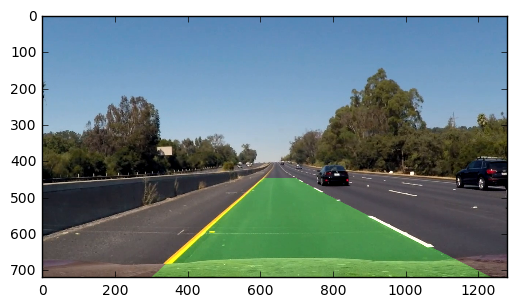

In [31]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from IPython.display import display
output = 'output.mp4'
clip1 = VideoFileClip("project_video.mp4")
output_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output, audio=False)